#### **Processamento de Áudio e Imagem** (2º semestre de 2024)

### **Experiência 1: Arranjos de Antenas (*Beamforming*)**


##### **Nome:** Ivan Matos

##### Setembro de 2024

---
---

In [1]:
using Plots, DSP, LinearAlgebra, LaTeXStrings, MAT, Statistics
# using DigitalComm

### **Parte Experimental 1**

#### **Item 1)** 
Imagine que queiramos projetar um sistema com 8 antenas, dispostas numa linha
plana, operando no padrão IEEE 802.11ad (WiGig) a 60GHz. A distância entre
cada antena adjacente é $d$. Desenhe o gráfico de $|B(\theta,\theta_0)|$ considerando $d = \lambda/4$
(comprimento de onda do sinal transmitido), $\theta_0 = −25º$
e $\theta$ variando entre $−90º$ e $90º$. Considere a velocidade de propagação $c = 3 \cdot 10^8 \, \text{m/s}$. Comente o que acontece com sinais vindos de diferentes direções quando recebidos por este sistema.

**Solução:**

In [2]:
M = 8                   # número de antenas no arranjo

f0 = 60e9               # frequência (da portadora) do sinal recebido, em Hz
Omega0 = 2 * pi * f0    # frequência (da portadora) do sinal recebido, em rad/s

c = 3e8                 # velocidade de propagação, em m/s
lambda = c / f0         # comprimento de onda do sinal, em metros

d = lambda/4            # distância entre antenas adjacentes do arranjo, em metros

theta0 = -25;           # direção de propagação de interesse, em graus

Definimos uma função ``B`` que calcula o ganho $B(\theta, \theta_0)$ do arranjo para uma sequência de ângulos ``thetas``, a partir da seguinte expressão (vista em aula), que fornece o ganho do arranjo para um ângulo $\theta$:

$$
B(\theta, \theta_0) = \frac{1}{M} \textbf{v}^{\textrm{H}}(\theta_0) \textbf{v}(\theta)
$$

onde

- $\textbf{v}(\theta) =
  \begin{bmatrix}
    1 \\
    e^{j\cdot \frac{\Omega_0 \, d \, \sin(\theta)}{c}} \\
    \vdots \\
    e^{j\cdot (M-1) \cdot \frac{\Omega_0 \, d \, \sin(\theta)}{c}}
    \end{bmatrix}$ é denominado *vetor diretor*, e

- $\theta_0$ é a direção de interesse,
- $M$ é o número de antenas do arranjo,
- $d$ é a distância entre antenas adjacentes,
- $\Omega_0 = 2 \pi f_0$ é a frequência angular da portadora do sinal, e
- $c$ é a velocidade de propagação do sinal.

In [3]:
# A implementação da função abaixo foi baseada no código disponiblizado na
# página da disciplina (arquivo PDF "Exemplo - beamformer com sinais reais").

function B(theta0, M, Omega0, d, c, thetas)

    N = length(thetas)
    B_calc = complex(zeros(N))

    # Vetor diretor, calculado em theta0
    v0 = exp.((0:M-1) * im * Omega0 * d * sind(theta0) / c)

    for i=1:N
        B_calc[i] = 1/M * v0' * exp.((0:M-1) * im * Omega0 * d * sind(thetas[i]) / c)
    end

    return B_calc
end

B (generic function with 1 method)

Abaixo, podemos observar o vetor diretor $\textbf{v}(\theta_0)$ do arranjo, calculado em $\theta=\theta_0$. Tal vetor é utilizado no cálculo do ganho $B(\theta, \theta_0)$ do arranjo.

In [4]:
v0 = exp.((0:M-1) * im * Omega0 * d * sind(theta0) / c)

8-element Vector{ComplexF64}:
                  1.0 - 0.0im
   0.7876275997333595 - 0.616151575619398im
  0.24071447172346644 - 0.9705959731540681im
  -0.4084408765640846 - 0.9127847776730078im
   -0.884113086205785 - 0.4672729938694106im
  -0.9842628593981458 + 0.17671056450983824im
  -0.6663521007031245 + 0.7456372294142327im
 -0.06541175191002183 + 0.9978583580408904im

A seguir, plotamos o gráfico de $|B(\theta,\theta_0)|$ para $\theta \in [-90º, 90º]$, considerando $M=8$, $\theta_0 = -25º$, $f_0 = 60 \, \textrm{GHz}$, $d=\lambda/4$ e $c=3\cdot10^{8} \, \textrm{m/s}$:

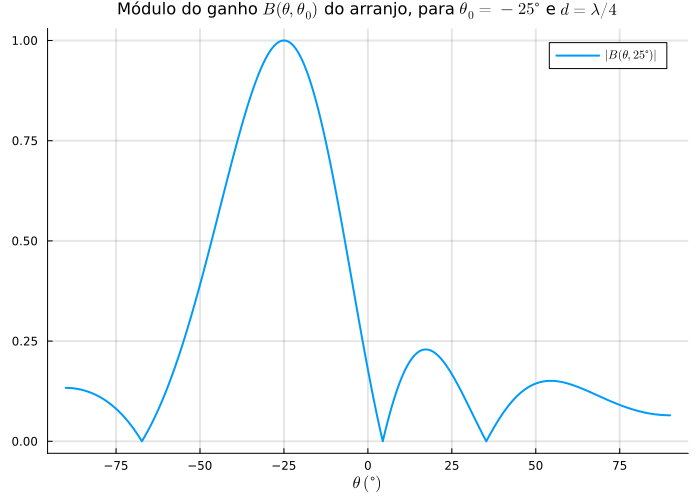

In [5]:
thetas = -90:0.01:90

plot(thetas, abs.(B(-25, 8, Omega0, d, c, thetas)), label=L"$|B(\theta, 25\degree)|$", lw=2, gridlinewidth = 2, size=(700,500))
title!(L"Módulo do ganho $B(\theta,\theta_0)$ do arranjo, para $\theta_0 = -25\degree$ e $d=\lambda/4$", titlefontsize=11)
xlabel!(L"$\theta \; (\degree)$")

Notamos que os sinais vindos de um ângulo $\theta = \theta_0 = -25º$ não sofrem atenuação, uma vez que $|B(\theta_0, \theta_0)| = 1$; Por outro lado, sinais vindos de direções $\theta \neq \theta_0$ são atenuados, dado que $|B(\theta, \theta_0)| < 1$ para todo $\theta \neq \theta_0$. De fato, por meio do arranjo proposto, somos capazes de "reforçar" o sinal recebido na direção $\theta_0$ de interesse, por meio da soma "em fase" dos sinais recebidos em tal direção por cada antena.

---

#### **Item 2)** 
Desenhe gráficos de $|B(\theta, \theta_0)|$ para $d = \lambda/2$, $d = 3\lambda/4$ e $d = \lambda$. Comente o que acontece, comparando os 4 gráficos de $|B(\theta, \theta_0)|$, conforme aumentamos o valor de $d$. Que problema você notou para $d > \lambda/2$?

**Solução:**

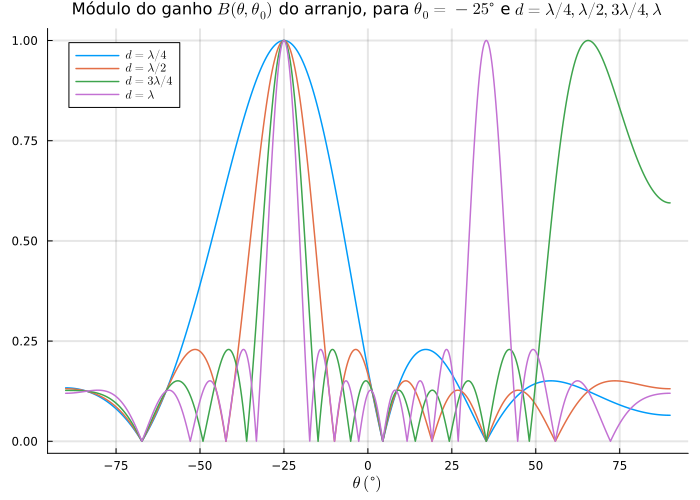

In [6]:
plot(thetas, abs.(B(-25, 8, Omega0, d, c, thetas)), label=L"$d= \lambda/4$", lw=1.5, gridlinewidth = 2, size=(700,500))
plot!(thetas, abs.(B(-25, 8, Omega0, lambda/2, c, thetas)), label=L"$d= \lambda/2$", lw=1.5)
plot!(thetas, abs.(B(-25, 8, Omega0, 3*lambda/4, c, thetas)), label=L"$d= 3\lambda/4$", lw=1.5)
plot!(thetas, abs.(B(-25, 8, Omega0, lambda, c, thetas)), label=L"$d= \lambda$", lw=1.5)

title!(L"Módulo do ganho $B(\theta,\theta_0)$ do arranjo, para $\theta_0 = -25\degree$ e $d=\lambda/4, \lambda/2, 3\lambda/4, \lambda$", titlefontsize=11)
xlabel!(L"$\theta \; (\degree)$")

Analisando os gráficos de $|B(\theta, \theta_0)|$ apresentados, notamos que, à medida que aumentamos a distância $d$ entre as antenas, o lóbulo do ganho centrado em $\theta_0$ torna-se mais estreito (o que se traduz em uma maior diretividade do arranjo, em torno de $\theta_0$). Enquanto isso, para $d > \lambda/2$, observamos o aparecimento de outros lóbulos de ganho elevado, para frequências $\theta \neq \theta_0$. Tal efeito é indesejado, uma vez que, a princípio, estamos interessados em reforçar (i.e., com ganho igual a 1) apenas sinais que chegam ao arranjo segundo um ângulo $\theta_0$, enquanto atenuamos sinais vindos de direções $\theta \neq \theta_0$.

---

### **Item 3)**
Desenhe agora os gráficos de $|B(\theta, 90º)|$ para $d = \lambda/4$ e $d = \lambda/2$. Você nota algum problema?

**Solução:**

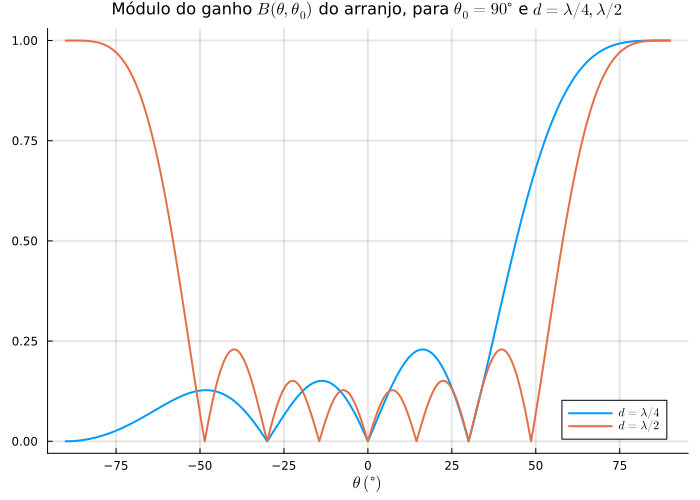

In [7]:
plot(thetas, abs.(B(90, 8, Omega0, lambda/4, c, thetas)), label=L"$d=\lambda/4$", lw=2, gridlinewidth = 2, size=(700,500))
plot!(thetas, abs.(B(90, 8, Omega0, lambda/2, c, thetas)), label=L"$d=\lambda/2$", lw=2)

title!(L"Módulo do ganho $B(\theta,\theta_0)$ do arranjo, para $\theta_0 = 90\degree$ e $d=\lambda/4, \lambda/2$", titlefontsize=11)
xlabel!(L"$\theta \; (\degree)$")

Analisando os gráficos de $|B(\theta, 90º)|$ para $d=\lambda/4$ e $d=\lambda/2$, é possível notar que o lóbulo em torno de $\theta_0 = 90º$ é consideravelmente extenso, isto é: o sistema fornece um ganho alto para um intervalo extenso em torno de $\theta_0$, o que representa *baixa* diretividade. Além disso, para $d = \lambda/2$, observamos que o arranjo apresenta um ganho elevado em torno de -90º também (com $|B(-90º, 90º)| = 1$), o que é indesejado, uma vez que desejamos atenuar sinais propagados segundo ângulos $\theta$ diferentes de $\theta_0$.

---

### **Item 4)**
Fixe $d = \lambda/2$. Suponha que uma frente de onda de frequência 60 GHz com amplitude $A_1 = 1$ incida sobre as antenas com ângulo $\theta_0 = −25º$, juntamente com um outro
sinal de interferência de mesma frequência e com amplitude $A_2 = 2$, que incide em um ângulo $\theta_2$. Plote a amplitude do sinal estimada pelo *Beamforming Delay-and-Sum* em função de $\theta_2$. Comente o resultado.

**Solução:**

Conforme apresentado no enunciado, consideramos que o sinal $f(t)$ que incide sobre o arranjo é formado por duas componentes:

$$
f(t) = f_1(t) + f_2(t) , \quad \textrm{onde} \quad f_1(t) = A_1 e^{j\Omega t} \quad \textrm{e} \quad f_2(t) = A_2 e^{j\Omega t}
$$.


Supomos que $f_1$ incide com ângulo $\theta_1 = \theta_0$, enquanto $f_2$ incide com ângulo $\theta_2$.


Conforme a Equação (8) apresentada no enunciado, o sinal estimado pelo beamformer DAS será dado por

$$
y(t) = B(\theta_0,\theta_0) A_1 e^{j\Omega t} + B(\theta_2,\theta_0) A_2 e^{j\Omega t}
$$

isto é,

$$
y(t) = A_1 e^{j\Omega t} + B(\theta_2,\theta_0) A_2 e^{j\Omega t}
= \big[ A_1 + B(\theta_2,\theta_0) A_2 \big] e^{j\Omega t}
$$

Portanto, a amplitude de $y(t)$ estimada pelo sistema é

$$A = |A_1 + B(\theta_2,\theta_0) \cdot A_2|$$

Abaixo, plotamos a amplitude $A$ em função de $\theta_2$, fixados $A_1 = 1$, $A_2 = 2$ e $\theta_0 = -25º$:


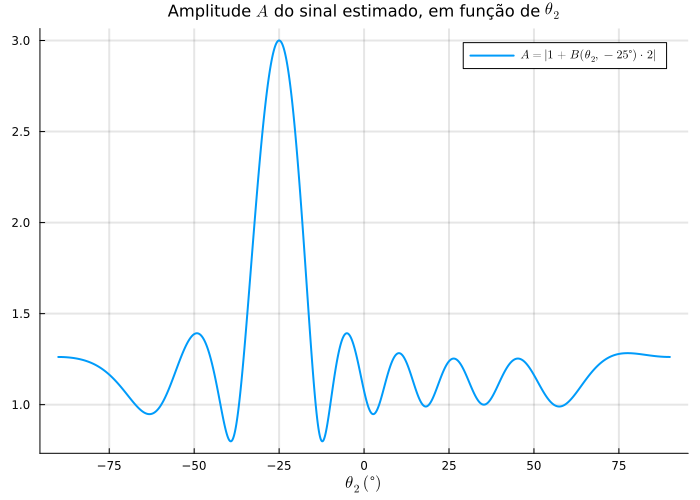

In [8]:
d = lambda / 2;         # distância entre antenas adjacentes do arranjo, em metros
thetas2 = -90:0.01:90

A1 = 1
A2 = 2
A = abs.(A1 .+ A2 * B(-25, 8, Omega0, d, c, thetas2))

plot(thetas2, A, label=L"$A = |1 + B(\theta_2,-25\degree) \cdot 2|$", lw=2, gridlinewidth = 2, size=(700,500))
title!(L"Amplitude $A$ do sinal estimado, em função de $\theta_2$", titlefontsize=11)
xlabel!(L"$\theta_2 \; (\degree)$")

O gráfico apresenta um comportamento coerente:

- Para $\theta_2 = \theta_0 = -25º$, esperamos que ambos os sinais que incidem sobre o arranjo se reforcem; de fato, em tal caso, o gráfico mostra que teríamos um sinal resultante cuja amplitude é máxima e igual 3, conforme esperado (dado que $A_1 + A_2 = 3$, e que, além disso, o sistema não atenua sinais vindos da direção $\theta_0$). 

- Para $\theta_2 \neq \theta_0$, esperamos que o sinal vindo da direção $\theta_2$ seja atenuado, e, portanto, a amplitude resultante $A$ deve aproximar-se da amplitude $A_1 (=1)$ do sinal que incide sobre o arranjo com ângulo $\theta_0$. Tal comportamento também é verificado no gráfico apresentado.

---
---

### **Parte Experimental 2**

Considere que o arranjo de antenas da parte 1 do experimento receba uma sequência de
dados modulados usando 16-QAM. O sinal de interesse tem amplitude máxima
$A_0 = 3$ e incide com ângulo $\theta_0 = 20º$. Há também dois sinais de interferência incidindo
sobre o arranjo, vindos das direções $\theta_1 = 45º$
e $\theta_2 = −15º$, ambos com amplitude 1 e com mesma frequência. Há também em cada antena um ruído na medida, de potência unitária.
O que é de fato medido pelo arranjo ("sinal de interesse" + "interferências" + "ruído")
está no arquivo ``sinais.mat``. Considerando as condições da parte 1 do experimento, vamos
projetar um sistema *beamforming Delay-and-Sum* para recuperar o sinal de interesse.

**IMPORTANTE:** Conforme o enunciado, para a Parte Experimental 2, fixamos $\theta_0 = 20º$ e $d = \lambda / 2$ (vide Item 4 da Parte Experimental 1).

In [9]:
theta0 = 20;            # direção de propagação de interesse, em graus

d = lambda / 2;         # distância entre antenas adjacentes do arranjo, em metros

Abaixo, plotamos o módulo do ganho do arranjo, $|B(\theta, 20º)|$:

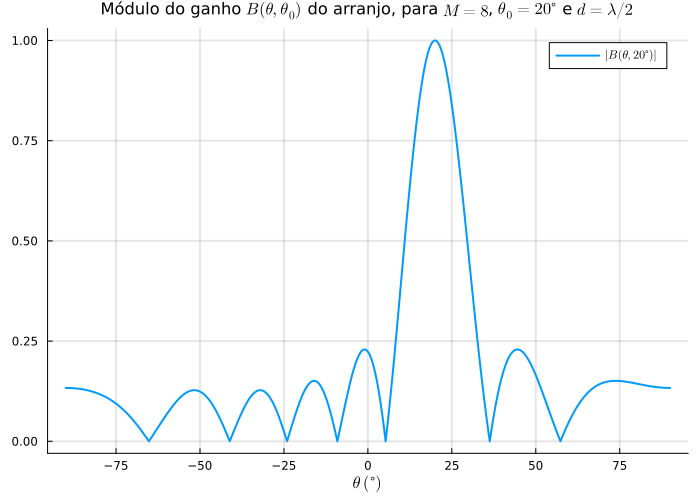

In [10]:
thetas = -90:0.01:90

plot(thetas, abs.(B(theta0, 8, Omega0, d, c, thetas)), label=L"$|B(\theta, 20\degree)|$", lw=2, gridlinewidth = 2, size=(700,500))
title!(L"Módulo do ganho $B(\theta,\theta_0)$ do arranjo, para $M=8$, $\theta_0 = 20\degree$ e $d=\lambda/2$", titlefontsize=11)
xlabel!(L"$\theta \; (\degree)$")

### **Item 1)**

A partir dos sinais fornecidos, vamos realizar o processamento necessário para trabalhar com sinais reais. Utilize para o passa-baixas um
filtro Butterworth de ordem 6 com a devida frequência de corte — ela deve ser igual à frequência de portadora dos sinais. A frequência de amostragem utilizada é $f_a = 10^{12} \; \textrm{Hz}$.

Plote também os gráficos de $x_{im}$ e $x_{qm}$ filtrados para uma das 8 antenas. Comente
o que você observa.

**Solução:**

Inicialmente, projetamos o filtro passa-baixas especificado, com frequência de corte em $f_0 = 60 \, \textrm{GHz}$:

In [11]:
fa = 1e12           # frequência de amostragem, em Hz
Ta = 1/fa           # período de amostragem, em segundos

wn = Omega0 / fa    # frequência de corte normalizada (2*pi*f0/fa), em rad/amostra

print("Frequência de corte normalizada [rad/amostra]: ", wn)

Frequência de corte normalizada [rad/amostra]: 0.37699111843077515

In [12]:
flt = digitalfilter(Lowpass(wn/pi), Butterworth(6))

ZeroPoleGain{:z, ComplexF64, ComplexF64, Float64}(ComplexF64[-1.0 + 0.0im, -1.0 + 0.0im, -1.0 + 0.0im, -1.0 + 0.0im, -1.0 + 0.0im, -1.0 + 0.0im], ComplexF64[0.8488957023445252 + 0.3246492013107824im, 0.8488957023445252 - 0.3246492013107824im, 0.737740221796323 + 0.20654024596940496im, 0.737740221796323 - 0.20654024596940496im, 0.6858878054187985 + 0.0702854674932448im, 0.6858878054187985 - 0.0702854674932448im], 2.3133049709735813e-5)

Abaixo, plotamos a resposta em frequência do filtro (onde denotamos por $\omega$ a frequência normalizada, em rad/amostra):

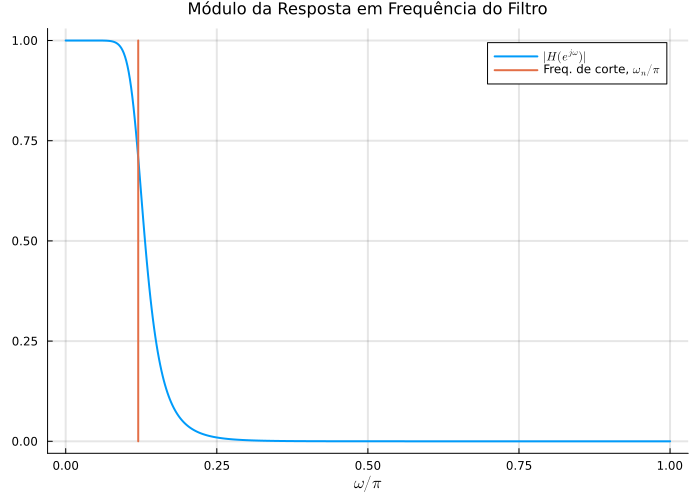

In [13]:
omegas = range(0, pi, length=500)
H = freqresp(flt, omegas)

plot(omegas/pi, abs.(H), label=L"$|H(e^{j\omega})|$", lw=2, gridlinewidth = 2, size=(700,500))
plot!([wn/pi,wn/pi], [0,1], label=L"Freq. de corte, $\omega_n / \pi$", lw=2)
title!("Módulo da Resposta em Frequência do Filtro", titlefontsize=11)
xlabel!(L"$\omega / \pi$")

Agora, vamos ler a matriz armazenada no arquivo ``sinais.mat`` fornecido, a qual contém os sinais recebidos pelas 8 antenas, amostrados em 10000 pontos, e com a frequência de amostragem $f_a$ especificada.

In [14]:
# file = matopen("Dados/sinais.mat")
X = matread("Dados/sinais.mat")["sinal_recebido"]

10000×8 Matrix{Float64}:
 -2.95195    1.22824     1.11289   …  -2.44328   -0.410231   1.11015
  0.209043   0.658147    0.493493     -4.38154    0.85918    3.39712
  0.226137   1.58435     1.25521      -3.43218    3.0611     1.06889
  0.922259   4.05686     0.205816     -3.61785    1.63881    3.00469
  1.02065    1.85737     1.05663      -3.6066     1.8664     3.64131
  4.04099    4.17772    -0.721782  …   0.376167   3.03991    4.10953
  3.78908    1.70149     1.03911       0.176173   1.94558    2.28042
  2.1073     2.0594      0.240073      2.50395    2.8084     1.35402
  4.74378   -0.0221734  -0.382128      1.65258    1.82042    0.163137
  2.15866    0.620936   -2.29665       1.85175    0.237352  -1.42691
  1.33131   -1.02344    -1.56309   …   3.31658   -0.987903  -1.89443
 -1.25425   -2.3043     -0.466801      3.12185   -2.12356   -0.370516
 -4.6692    -4.35299    -0.345492      3.67126   -2.90103   -1.87937
  ⋮                                ⋱   ⋮                    
  5.29509    0.

Observamos que a matriz possui dimensão $(10000, 8)$: sua $m$-ésima coluna ($m=0,1,...,7$) corresponde ao sinal $x_m$, amostrado em 10000 pontos (com taxa de amostragem $f_a$).

Observemos o sinal $x_0$, recebido pela antena $m=0$:

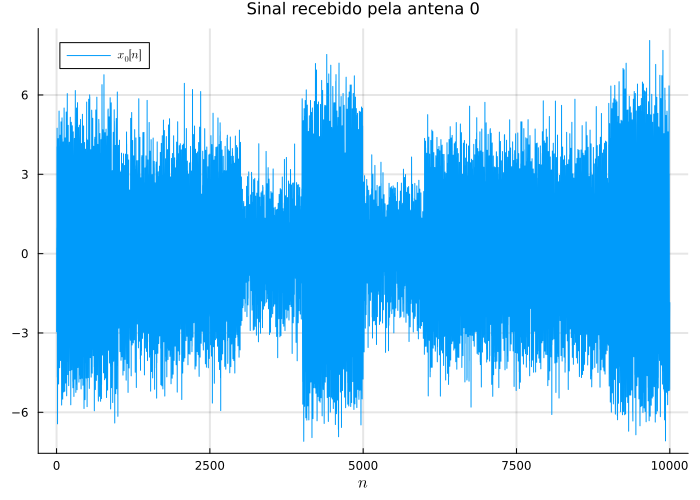

In [15]:
# Sinal recebido pela antena 0
x0 = X[:,1]

plot(x0, label=L"$x_0[n]$", gridlinewidth = 2, size=(700,500))
title!("Sinal recebido pela antena 0", titlefontsize=11)
xlabel!(L"$n$")

Consideremos a notação vista em aula. Vamos obter as partes real e imaginária ($x_{im}$ e $x_{qm}$, respectivamente) do *sinal analítico* $x_{am}$, para a antena $m=0$:

In [16]:
# Obtendo x_i0
x_i0_til = x0 .* 2 .* cos.(Omega0 * Ta *(0:10000-1))
x_i0 = filt(flt, x_i0_til);

# Obtendo x_q0
x_q0_til = x0 .* (-2) .* sin.(Omega0 * Ta * (0:10000-1))
x_q0 = filt(flt, x_q0_til);

Plotemos os gráficos de $x_{i0}$ e $x_{q0}$ (filtrados):

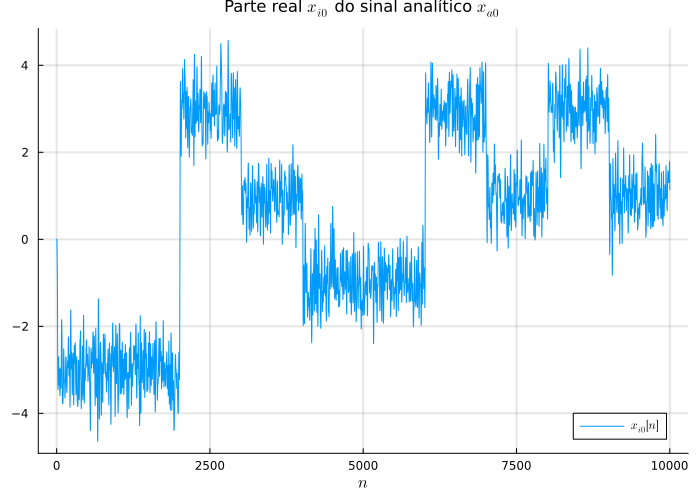

In [17]:
plot(x_i0, label=L"$x_{i0}[n]$", gridlinewidth = 2, size=(700,500))
title!(L"Parte real $x_{i0}$ do sinal analítico $x_{a0}$", titlefontsize=11)
xlabel!(L"$n$")

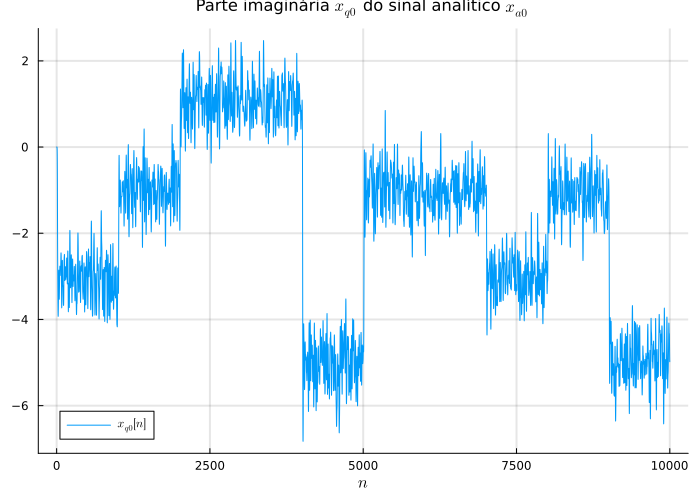

In [18]:
plot(x_q0, label=L"$x_{q0}[n]$", gridlinewidth = 2, size=(700,500))
title!(L"Parte imaginária $x_{q0}$ do sinal analítico $x_{a0}$", titlefontsize=11)
xlabel!(L"$n$")

Analisando os gráficos de $x_{i0}$ e $x_{q0}$, podemos observar que tais sinais apresentam "degraus". No entanto, notamos que os níveis correspondentes aos degraus não estão limitados aos valores $-1, +1, -3, +3$ (como seria esperado em uma codificação 16-QAM). Isto resulta do fato que o sinal $x_0$ recebido pela antena 0 não é constituído apenas pelo sinal de interesse (isto é, o sinal recebido segundo o ângulo $\theta_0$); Efetivamente, $x_0$ é composto também pelos sinais propagados nas direções $\theta_1$ e $\theta_2$, diferentes de $\theta_0$, além de sofrer o efeito do ruído de medida na antena.

Por meio do arranjo DAS, buscamos combinar os sinais das diferentes antenas, de forma a reforçar o sinal recebido na direção $\theta_0$ (e, finalmente, poderemos extrair, do sinal resultante, os símbolos codificados em 16-QAM).

Podemos também plotar, por exemplo, as partes real e imaginária do *sinal analítico* $x_{a1}$, correspondente à antena $m=1$, com o objetivo de comparar os sinais recebidos por antenas diferentes:

In [19]:
# Sinal recebido pela antena 1
x1 = X[:,2]

# Obtendo x_i1
x_i1_til = x1 .* 2 .* cos.(Omega0 * Ta *(0:10000-1))
x_i1 = filt(flt, x_i1_til);

# Obtendo x_q1
x_q1_til = x1 .* (-2) .* sin.(Omega0 * Ta * (0:10000-1))
x_q1 = filt(flt, x_q1_til);

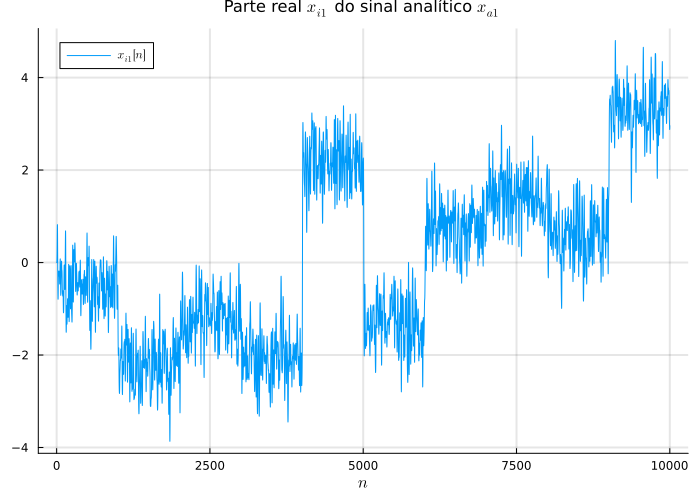

In [20]:
plot(x_i1, label=L"$x_{i1}[n]$", gridlinewidth = 2, size=(700,500))
title!(L"Parte real $x_{i1}$ do sinal analítico $x_{a1}$", titlefontsize=11)
xlabel!(L"$n$")

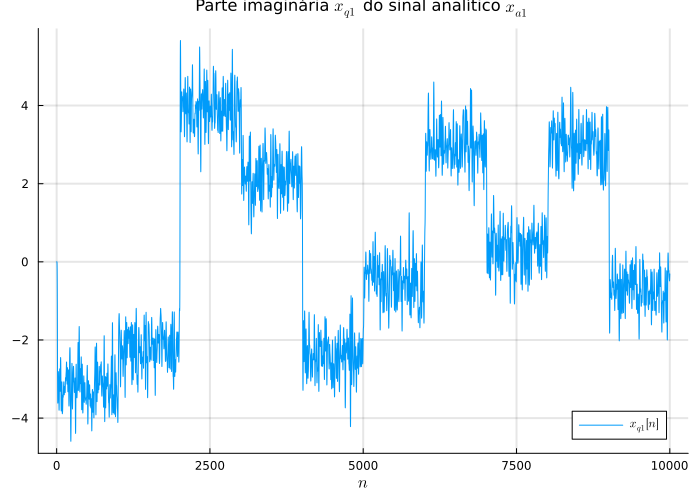

In [21]:
plot(x_q1, label=L"$x_{q1}[n]$", gridlinewidth = 2, size=(700,500))
title!(L"Parte imaginária $x_{q1}$ do sinal analítico $x_{a1}$", titlefontsize=11)
xlabel!(L"$n$")

---

### **Item 2)**

Projete os coeficientes do vetor $\textbf{w}$ e realize o *Delay-and-Sum* para recuperar o sinal. Plote as partes reais e imaginárias do $y[n]$ obtido. Comente o resultado.

**Solução:**

Como visto em aula, os coeficientes $\textbf{w}$ do arranjo são dados por $\textbf{w} = \frac{1}{M} \textbf{v}(\theta_0)$, onde 

$\textbf{v}(\theta) =
  \begin{bmatrix}
    1 \\
    e^{j\cdot \frac{\Omega_0 \, d \, \sin(\theta)}{c}} \\
    \vdots \\
    e^{j\cdot (M-1) \cdot \frac{\Omega_0 \, d \, \sin(\theta)}{c}}
\end{bmatrix}$

 é denominado *vetor diretor*.

 A seguir, calculamos $\textbf{w}$.

In [22]:
# Vetor diretor calculado em Omega0
v0 = exp.((0:M-1) * im * Omega0 * d * sind(theta0) / c)

# Coeficientes do arranjo
w = v0 / M

8-element Vector{ComplexF64}:
                0.125 + 0.0im
 0.059522819713834295 + 0.1099183057243623im
 -0.06831254293303006 + 0.1046823599181014im
 -0.12458130254897531 - 0.010222477938380457im
 -0.05033434364836678 - 0.11441789129977933im
  0.07664462955064068 - 0.09874513031560117im
   0.1233280151167892 + 0.02037647386946562im
  0.04080866980074615 + 0.11815097320417496im

Calculemos o sinal analítico $x_{am} = x_{im} + j x_{qm}$ ("sinal de banda-base equivalente") recebido por cada antena $m$. 

Inicialmente, vamos construir duas matrizes, ambas de tamanho $(10000, 8)$:

- $\tilde{X}_i$, cuja $m$-ésima coluna corresponde ao sinal $\tilde{x}_{im}$

- $\tilde{X}_q$, cuja $m$-ésima coluna corresponde ao sinal $\tilde{x}_{qm}$

In [23]:
X_i_til = 2*cos.(Omega0 * Ta * (0:10000-1)) .* X;   # multiplicamos cada coluna de X pelo
                                                    # vetor 2*cos.(Omega0 * Ta * (0:10000-1))

X_q_til = -2*sin.(Omega0 * Ta * (0:10000-1)) .* X;  # multiplicamos cada coluna de X pelo
                                                    # vetor -2*sin.(Omega0 * Ta * (0:10000-1))

Em seguida, construímos duas novas matrizes, também de tamanho $(10000,8)$:

- $X_i$, cuja $m$-ésima coluna corresponde ao sinal $x_{im}$ (i.e. $\tilde{x}_{im}$ após a filtragem passa-baixas)

- $X_q$, cuja $m$-ésima coluna corresponde ao sinal $x_{qm}$ (i.e. $\tilde{x}_{qm}$ após a filtragem passa-baixas)

In [24]:
X_i = filt(flt, X_i_til);   # aplicamos o filtro passa-baixas a cada uma das colunas de X_i_til

X_q = filt(flt, X_q_til);   # aplicamos o filtro passa-baixas a cada uma das colunas de X_q_til

Finalmente, obtemos a matriz $X_a$, tal que sua $m$-ésima coluna representa o sinal analítico $x_{am} = x_{im} + j x_{qm}$ associado à antena $m$:

In [25]:
X_a = X_i + im .* X_q

10000×8 Matrix{ComplexF64}:
 -0.000136575+0.0im          …   5.13623e-5+0.0im
   -0.0014312-3.56035e-6im      0.000687753-5.78586e-5im
  -0.00729738-4.47061e-5im       0.00435992-0.000643975im
   -0.0244244-0.000307037im       0.0177628-0.00361763im
   -0.0611126-0.00149429im        0.0531793-0.0139241im
    -0.123354-0.00573008im   …     0.126508-0.0418131im
    -0.211499-0.0183425im          0.251549-0.104862im
    -0.320283-0.0503607im          0.432437-0.227922im
    -0.442692-0.119901im            0.65743-0.438585im
    -0.575743-0.249538im           0.897443-0.757787im
    -0.725187-0.458669im     …      1.11136-1.18893im
    -0.906044-0.753667im            1.25716-1.71086im
     -1.13705-1.12093im             1.30459-2.27841im
             ⋮               ⋱  
      1.38833-4.30462im              3.5913+1.07793im
      1.41273-4.33545im             3.42232+1.0634im
      1.45381-4.33396im      …      3.31411+0.995512im
      1.52216-4.32414im             3.27048+0.867201im
      

Calculemos $y[n]$, com base na expressão vista em aula:

$$
y[n] = w_0^* x_{a0}[n] + w_1^* x_{a1}[n] + ... + w_{M-1}^* x_{a(M-1)}[n]
$$

Matricialmente (na célula de código a seguir): Calculamos o produto interno entre o conjugado de $\textbf{w}$ e cada
uma das 10000 linhas de $X_a$, para obter o vetor $\textbf{y}$.
O produto interno entre o conjugado de $\textbf{w}$ e a $n$-ésima linha de $X_a$ corresponde 
ao valor do sinal $y$ no instante $n$.

Note: a $n$-ésima linha de $X_a$ tem $M=8$ elementos e corresponde aos valores dos
sinais analíticos nas antenas no instante $n$: $\, \big[x_{a0}[n], \, x_{a1}[n], \, ..., \, x_{a7}[n]\big]$. 

In [26]:
y = w' * transpose(X_a)

1×10000 adjoint(::Vector{ComplexF64}) with eltype ComplexF64:
 -3.5592e-5-2.21446e-5im  -0.000407901-0.000274515im  …  0.955198-3.1642im

Note que $y[n]$ é um sinal complexo. A seguir, plotamos as partes real e imaginária de $y[n]$: 

In [27]:
y_real = vec(real.(y));
y_imag = vec(imag.(y));

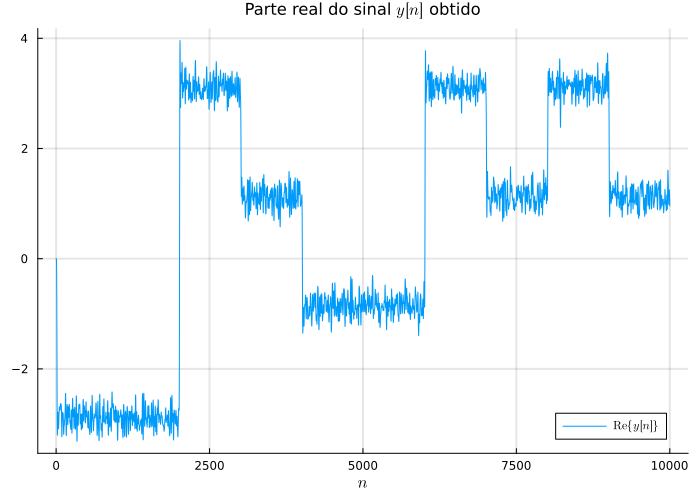

In [28]:
plot(y_real, label=L"$\textrm{Re}\{y[n]\}$", gridlinewidth = 2, size=(700,500))
title!(L"Parte real do sinal $y[n]$ obtido", titlefontsize=11)
xlabel!(L"$n$")

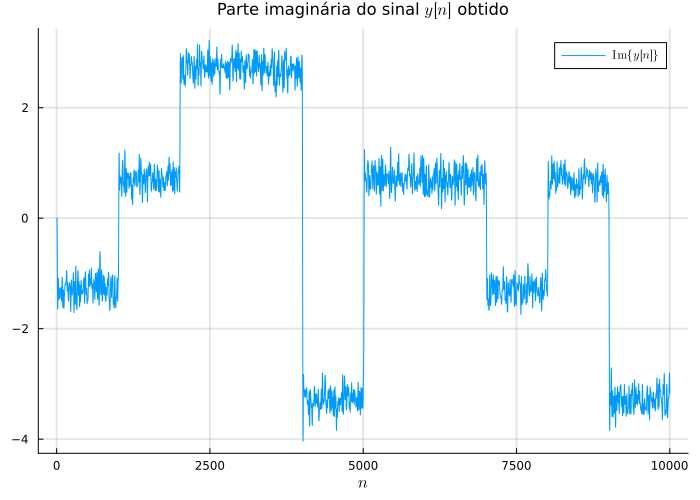

In [29]:
plot(y_imag, label=L"$\textrm{Im}\{y[n]\}$", gridlinewidth = 2, size=(700,500))
title!(L"Parte imaginária do sinal $y[n]$ obtido", titlefontsize=11)
xlabel!(L"$n$")

Analisando os dois gráficos acima, podemos notar que o sistema DAS efetivamente produz um sinal complexo $y[n]$ cujas componentes $\textrm{Re}\{y[n]\}$ e $\textrm{Im}\{y[n]\}$ são formadas por uma sequência de trechos (aproximadamente) em "degrau", com amplitudes em torno dos valores -1, +1, -3, +3 (de forma que $y[n]$ representa uma sequência de símbolos complexos codificados em 16-QAM).

---

### **Item 3)**

Agora vamos recuperar os símbolos que foram transmitidos. Para isto precisamos saber por quanto tempo cada símbolo foi transmitido, e juntamente com a informação da taxa de amostragem, obter o número $N$ de amostras no sinal correspondente a cada símbolo. Sabendo que cada símbolo foi transmitido por 1 ns, calcule $N$ e
comente se está coerente com o que se observa nos gráficos das partes real e imaginária de $y[n]$. Para cada trecho de símbolo, calcule o valor médio das $N$ amostras.
Quantos símbolos foram transmitidos?

**Solução:**

Como informado anteriormente, a frequência de amostragem utilizada é $f_a = 10^{12} \; \textrm{Hz}$, de modo que o intervalo de amostragem é $T_a = 1 / f_a = 10^{-12} \; \textrm{s}$.

Uma vez que cada símbolo é transmitido por 1 ns, resulta que o número $N$ de amostras correspondente a cada símbolo vale

$N = \frac{\textrm{Duração do símbolo}}{T_a} = \frac{1\cdot 10^{-9} \; \textrm{s}}{1\cdot 10^{-12} \; \textrm{s}} = 1000$.

Observando os gráficos das partes real e imaginária de $y[n]$, constatamos que o valor obtido para $N$ é coerente, uma vez que, visualmente, identificamos nos gráficos que os diferentes "trechos" possuem uma duração em torno de 1000 amostras.

Dado que o sinal $x[n]$ tem duração de 10000 amostras, concluímos que **10 símbolos foram transmitidos** (pois $\frac{\textrm{Número total de amostras}}{N} = \frac{10000}{1000} = 10$).

Abaixo, calculamos a média de $y[n]$ em cada um dos 10 intervalos (e armazenamos os resultados em um vetor ``simbolos_complexos_recebidos``):

In [30]:
function calcula_media_por_trechos(y, N, verbose = false)

    # y: sinal para o qual desejamos calcular a média em cada trecho
    # N: número de amostras por trecho
    
    num_simbolos = floor(Int, length(y)/N)  # número de símbolos recebidos (usamos a função 'floor',
                                            # pois consideramos que cada símbolo corresponde
                                            # a exatamente N amostras)

    simbolos_complexos_recebidos = zeros(Complex, num_simbolos)

    for i=0:num_simbolos-1
        media_intervalo = mean(y[N*i + 1 : min(N*(i + 1), length(y))])
        simbolos_complexos_recebidos[i+1] = media_intervalo
        if verbose
            print(i+1, "º símbolo:  ", media_intervalo, "\n")
        end
    end

    return simbolos_complexos_recebidos

end

calcula_media_por_trechos (generic function with 2 methods)

In [31]:
simbolos_complexos_recebidos = calcula_media_por_trechos(y, 1000, true);

1º símbolo:  -2.8366128893893046 - 1.2676447762269232im
2º símbolo:  -2.908567513851961 + 0.6925621943092749im
3º símbolo:  3.0486209026351605 + 2.717051524042338im
4º símbolo:  1.1388729997047675 + 2.70456137459784im
5º símbolo:  -0.8479871528652886 - 3.2224324189947704im
6º símbolo:  -0.84245075206927 + 0.696500950174579im
7º símbolo:  3.078740665797229 + 0.6890988146844758im
8º símbolo:  1.153214925983305 - 1.2703541051517908im
9º símbolo:  3.111434995550595 + 0.6658550476136255im
10º símbolo:  1.1477691468491193 - 3.2526096869055725im


---

### **Item 4)**

Escreva num trecho do seu código um algoritmo que decide a qual símbolo do 16-QAM cada símbolo reconstruído na etapa anterior se refere, utilizando a mínima distância em módulo para cada símbolo reconstruído em relação aos símbolos do 16-QAM.

**Solução:**

In [32]:
# qammod(0:15,16)

# Tabela de símbolos na representação 16-QAM
tabela_simbolos = [-3 + 3im;
                   -3 + 1im;
                   -3 - 3im;
                   -3 - 1im;

                   -1 + 3im;
                   -1 + 1im;
                   -1 - 3im;
                   -1 - 1im;

                    3 + 3im;
                    3 + 1im;
                    3 - 3im;
                    3 - 1im;

                    1 + 3im;
                    1 + 1im;
                    1 - 3im;
                    1 - 1im;
                   ];


# Função que retorna os símbolos complexos da modulação 16-QAM correspondentes a uma
# sequência de números complexos recebidos
function calcula_simbolos_complexos_16_qam(simbolos_complexos_recebidos)

    n_simbolos = length(simbolos_complexos_recebidos)

    simbolos_complexos_16_qam = zeros(Complex, n_simbolos)

    for i=1:n_simbolos

        dists = norm.(simbolos_complexos_recebidos[i] .- tabela_simbolos)   # Distância entre o i-ésimo símbolo reconstruído 
                                                                            # e cada um dos símbolos complexos do 16-QAM

        idx = argmin(dists)     # índice correspondente ao símbolo complexo do 16-QAM mais próximo ao símbolo reconstruído

        simbolos_complexos_16_qam[i] = tabela_simbolos[idx]    # Selecionamos o símbolo do 16-QAM cuja representação complexa
                                                               # esteja mais próxima (em termos da "norma") ao símbolo reconstruído

    end

    return(simbolos_complexos_16_qam)
end

calcula_simbolos_complexos_16_qam (generic function with 1 method)

Abaixo, definimos também uma função para retornar os símbolos decimais correspondentes a símbolos complexos dados, conforme a codificação 16-QAM:

In [33]:
# Função que retorna os símbolos decimais correspondentes a uma
# sequência de números complexos, conforme a modulação 16-QAM
function converte_complexo_decimal_16_qam(simb_complexos)

    n_simbolos = length(simb_complexos)

    simbolos_decimais_16_qam = zeros(Int, n_simbolos)

    for i=1:n_simbolos

        # Note: subtraímos 1, para que o resultado esteja entre 0 e 15
        simbolos_decimais_16_qam[i] = findall(tabela_simbolos .== simb_complexos[i])[1] - 1  

    end

    return(simbolos_decimais_16_qam)
end

converte_complexo_decimal_16_qam (generic function with 1 method)

Finalmente, definimos uma função que converte uma sequência de símbolos decimais na sequência de símbolos complexos correspondentes:

In [34]:
# Função que retorna os símbolos complexos correspondentes a uma
# sequência de números decimais, conforme a modulação 16-QAM
function converte_decimal_complexo_16_qam(simb_decimais)

    n_simbolos = length(simb_decimais)

    simbolos_complexos = zeros(Complex, n_simbolos)

    for i=1:n_simbolos
        simbolos_complexos[i] = tabela_simbolos[simb_decimais[i] + 1]   # Note: dentro dos colchetes, somamos 1, pois os
                                                                        # índices de vetores em Julia iniciam em 1
    end

    return(simbolos_complexos)
end

converte_decimal_complexo_16_qam (generic function with 1 method)

---

### **Item 5)**

Compare os símbolos reconstruídos com o vetor **mensagem** fornecido e diga se
houve erros na transmissão. O vetor fornecido está em decimal, então utilize a Tabela 1 para conversão. Plote num mesmo gráfico as partes reais e imaginárias da
mensagem e do sinal reconstruído em 16-QAM, utilizando a função *scatter* do Matlab. Se feito corretamente, o gráfico deve apresentar um mapa no plano complexo
com os pontos de ambos os vetores.

**Solução:**

Utilizando as funções ``calcula_simbolos_complexos_16_qam`` e ``converte_complexo_decimal_16_qam`` definidas no item anterior, vamos recuperar os símbolos decimais recebidos pelo arranjo de antenas:

In [35]:
simbolos_complexos_16_qam = calcula_simbolos_complexos_16_qam(simbolos_complexos_recebidos)
simbolos_decimais_16_qam = converte_complexo_decimal_16_qam(simbolos_complexos_16_qam)

print("Símbolos reconstruídos, no código decimal:  ", simbolos_decimais_16_qam)

Símbolos reconstruídos, no código decimal:  [3, 1, 8, 12, 6, 5, 9, 15, 9, 14]

Os vetores ``simbolos_complexos_16_qam`` e ``simbolos_decimais_16_qam`` contém, respectivamente, os símbolos complexos e decimais associados à sequência de valores complexos ``simbolos_complexos_recebidos`` (obtidos calculando-se a média de $y[n]$ em cada trecho).

A seguir, mostramos os símbolos que foram efetivamente transmitidos:

In [36]:
simbolos_esperados = Int.(vec(matread("Dados/mensagem.mat")["mensagem"]))

print("Símbolos esperados, no código decimal:  ", simbolos_esperados)

Símbolos esperados, no código decimal:  [3, 1, 8, 12, 6, 5, 9, 15, 9, 14]

Observamos que a sequência reconstruída correspondente exatamente à sequência esperada, em decimal. Portanto, não houve erro na transmissão/recuperação da mensagem. De fato, temos:

In [37]:
simbolos_decimais_16_qam == simbolos_esperados

true

In [38]:
print("Nº de símbolos corretamente reconstruídos / Nº total de símbolos = ",
        sum(simbolos_decimais_16_qam .== simbolos_esperados), "/", length(simbolos_esperados))

Nº de símbolos corretamente reconstruídos / Nº total de símbolos = 10/10

[*Observação: a reconstrução dos símbolos estava completamente incorreta quando projetei o arranjo utilizando $d = \lambda / 4$, em vez de $d = \lambda / 2$, por engano.*]

A seguir, plotamos os números complexos referentes à mensagem esperada e à sequência reconstruída em 16-QAM. Notamos que, para cada símbolo esperado, o valor reconstruído está correto.

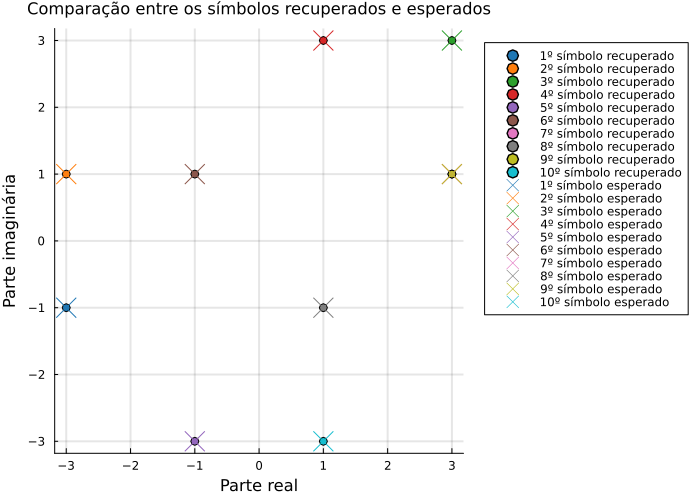

In [39]:
simbolos_complexos_esperados = converte_decimal_complexo_16_qam(simbolos_esperados)


plt = plot(legend=:outertopright, size=(700,500), gridlinewidth = 2)
for i=1:10
    scatter!(plt, [real(simbolos_complexos_16_qam[i])],
                  [imag(simbolos_complexos_16_qam[i])],
                  label=string(i)*"º símbolo recuperado", mc=palette(:tab10)[i], marker=:o)
end


for i=1:10
    scatter!(plt, [real(simbolos_complexos_esperados[i])],
                  [imag(simbolos_complexos_esperados[i])],
                  label=string(i)*"º símbolo esperado", mc=palette(:tab10)[i], marker=:X, ms=10)
end


xlabel!("Parte real")
ylabel!("Parte imaginária")
title!("Comparação entre os símbolos recuperados e esperados", titlefontsize=11)

plt

**Observação:** No gráfico acima, os pontos correspondentes aos "*símbolos recuperados*" representam os símbolos complexos do 16-QAM mais próximos dos símbolos complexos reconstruídos --- isto é, plotamos os valores de ``simbolos_complexos_16_qam``, em vez de ``simbolos_complexos_recebidos``.

Em outras palavras: no gráfico, o "$k$-ésimo símbolo recuperado" corresponde ao número complexo em 16-QAM que está mais próximo ao valor médio do sinal $y[n]$ no $k$-ésimo trecho de 1000 amostras (conforme calculado no item 3).

No item a seguir, o mesmo padrão é utilizado para plotar e comparar (no plano complexo) os símbolos recuperados e a mensagem esperada.

---

### **Item 6)**

Vamos observar o que acontece se diminuirmos a relação sinal/ruído nas antenas. Ao sinal fornecido no vetor ``sinais.mat`` some em cada antena ruídos brancos gaussianos
e média nula com desvio-padrão 10, 30 e 50, utilizando a função *randn*. Realize
novamente o *Delay-and-Sum* para cada caso, plote os gráficos das partes reais e
imaginárias de $y[n]$ e comente o que você observa nos gráficos. O que acontece com
os símbolos reconstruídos? Eles apresentam erros? Plote os símbolos reconstruídos
e os da mensagem original utilizando o *scatter* e comente o que você observa.

**Solução:**

Primeiramente, para evitar repetições no código, vamos definir uma função ``DAS`` que permite obter a saída $y[n]$ do sistema *Delay-and-Sum*:

In [40]:
function DAS(X, fa, theta0, M, Omega0, d, c)

    # Calculando o nº de amostras do sinal de entrada e o período de amostragem
    n_amostras = size(X)[1]
    Ta = 1/fa

    # Projetando o Filtro Passa-Baixas (tipo Butterworth), com corte em f0
    wn = Omega0 / fa    # frequência de corte normalizada (2*pi*f0/fa), em rad/amostra
    flt = digitalfilter(Lowpass(wn/pi), Butterworth(6))

    # Componentes em fase e em quadratura do sinal em cada antena
    X_i_til = 2*cos.(Omega0 * Ta * (0:n_amostras-1)) .* X
    X_q_til = -2*sin.(Omega0 * Ta * (0:n_amostras-1)) .* X

    # Partes real e imaginária do sinal analítico, em cada antena
    X_i = filt(flt, X_i_til)
    X_q = filt(flt, X_q_til)

    # Sinal analítico em cada antena
    X_a = X_i + im .* X_q

    # Vetor diretor calculado em Omega0
    v0 = exp.((0:M-1) * im * Omega0 * d * sind(theta0) / c)

    # Coeficientes do arranjo
    w = v0 / M

    # Saída complexa do arranjo DAS
    y = w' * transpose(X_a)

    return y

end

DAS (generic function with 1 method)

Vamos também definir uma função ``avalia_reconstrucao`` para avaliar a reconstrução dos símbolos recebidos pelo arranjo, de acordo com a modulação 16-QAM:

In [41]:
function avalia_reconstrucao(simbolos_reconstruidos_decimais, simbolos_esperados)

    simbolos_reconstruidos_decimais = Int.(simbolos_reconstruidos_decimais)
    simbolos_esperados = Int.(simbolos_esperados)

    print("Símbolos reconstruídos: ", simbolos_reconstruidos_decimais, "\n")
    print("Símbolos esperados:     ", simbolos_esperados, "\n\n")

    print("Nº de símbolos corretamente reconstruídos / Nº total de símbolos = ",
            sum(simbolos_reconstruidos_decimais .== simbolos_esperados), "/", length(simbolos_esperados))
    
    return(simbolos_reconstruidos_decimais)

end

avalia_reconstrucao (generic function with 1 method)

**1º caso) Adicionando ruído branco gaussiano de média nula e desvio-padrão 10**

In [42]:
# Sinais recebidos pelo arranjo, somados a um ruído branco gaussiano de média nula e desvio-padrão de 10
X_ruidoso_10 = X + 10 * randn(size(X))

# Saída do arranjo DAS
y_ruidoso_10 = DAS(X_ruidoso_10, fa, theta0, M, Omega0, d, c)

1×10000 adjoint(::Vector{ComplexF64}) with eltype ComplexF64:
 9.27578e-5-0.000170429im  0.000906564-0.00185578im  …  -1.07566-5.04028im

Plotando a parte real e imaginária de $y[n]$:

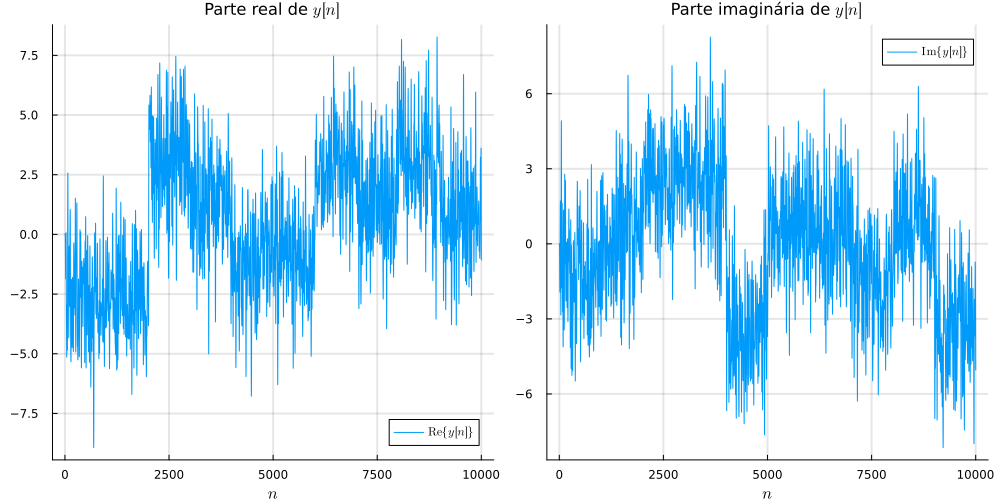

In [43]:
p1 = plot(vec(real(y_ruidoso_10)), label=L"$\textrm{Re}\{y[n]\}$")
title!(L"Parte real de $y[n]$", titlefontsize=11)
xlabel!(L"$n$")
p2 = plot(vec(imag(y_ruidoso_10)), label=L"$\textrm{Im}\{y[n]\}$")
title!(L"Parte imaginária de $y[n]$", titlefontsize=11)
xlabel!(L"$n$")

plot(p1, p2, layout = (1,2), gridlinewidth = 2)
plot!(size=(1000,500))

In [44]:
simbolos_complexos_recebidos = calcula_media_por_trechos(y_ruidoso_10, 1000, true);

1º símbolo:  -2.563805983534064 - 1.196478214350238im
2º símbolo:  -2.6163024878940515 + 0.3383669772318248im
3º símbolo:  3.077983791471865 + 2.54084730107213im
4º símbolo:  1.3243371656794274 + 2.673321429639936im
5º símbolo:  -1.135766248949819 - 3.382035843204633im
6º símbolo:  -0.9745697656948824 + 0.7366548336289744im
7º símbolo:  2.8200125954589024 + 0.6134148927982637im
8º símbolo:  1.3065150624608752 - 1.4589965575604928im
9º símbolo:  3.114284952305227 + 0.7316465087227954im
10º símbolo:  0.8221028825088419 - 3.305072511156804im


A seguir, apresentamos os símbolos reconstruídos (no código decimal) e avaliamos quantos estão corretos:

In [45]:
simbolos_complexos_16_qam = calcula_simbolos_complexos_16_qam(simbolos_complexos_recebidos)
simbolos_decimais_16_qam = converte_complexo_decimal_16_qam(simbolos_complexos_16_qam)

avalia_reconstrucao(simbolos_decimais_16_qam, simbolos_esperados);

Símbolos reconstruídos: [3, 1, 8, 12, 6, 5, 9, 15, 9, 14]
Símbolos esperados:     [3, 1, 8, 12, 6, 5, 9, 15, 9, 14]

Nº de símbolos corretamente reconstruídos / Nº total de símbolos = 10/10

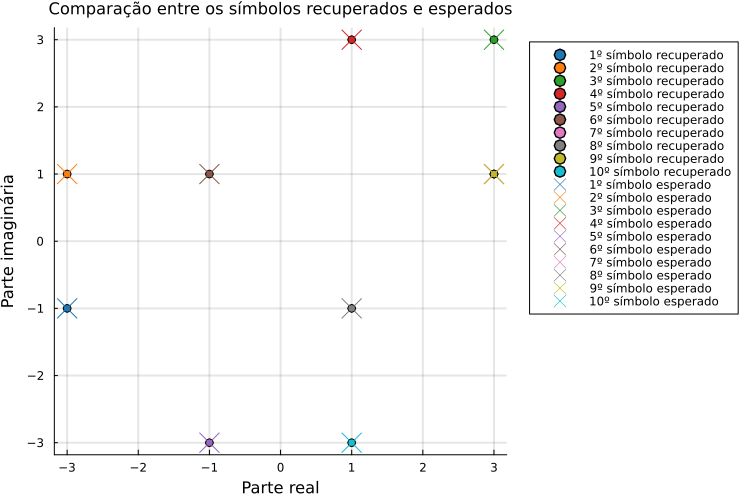

In [46]:
simbolos_complexos_esperados = converte_decimal_complexo_16_qam(simbolos_esperados)


plt = plot(legend=:outertopright, size=(750,500), gridlinewidth = 2)
for i=1:10
    scatter!(plt, [real(simbolos_complexos_16_qam[i])],
                  [imag(simbolos_complexos_16_qam[i])],
                  label=string(i)*"º símbolo recuperado", mc=palette(:tab10)[i], marker=:o)
end


for i=1:10
    scatter!(plt, [real(simbolos_complexos_esperados[i])],
                  [imag(simbolos_complexos_esperados[i])],
                  label=string(i)*"º símbolo esperado", mc=palette(:tab10)[i], marker=:X, ms=10)
end


xlabel!("Parte real")
ylabel!("Parte imaginária")
title!("Comparação entre os símbolos recuperados e esperados", titlefontsize=11)

plt

Observamos que, neste caso, todos os símbolos foram corretamente recuperados.

**2º caso) Adicionando ruído branco gaussiano de média nula e desvio-padrão 30**

In [47]:
# Sinais recebidos pelo arranjo, somados a um ruído branco gaussiano de média nula e desvio-padrão de 30
X_ruidoso_30 = X + 30 * randn(size(X))

# Saída do arranjo DAS
y_ruidoso_30 = DAS(X_ruidoso_30, fa, theta0, M, Omega0, d, c)

1×10000 adjoint(::Vector{ComplexF64}) with eltype ComplexF64:
 -0.000130395+1.36165e-5im  -0.00204075+0.000477143im  …  0.058057+1.69449im

Plotando a parte real e imaginária de $y[n]$:

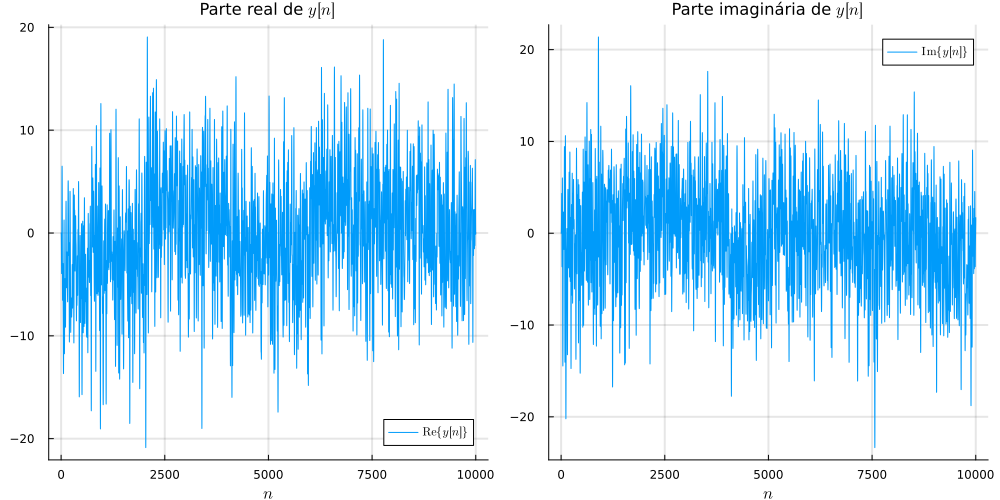

In [48]:
p1 = plot(vec(real(y_ruidoso_30)), label=L"$\textrm{Re}\{y[n]\}$")
title!(L"Parte real de $y[n]$", titlefontsize=11)
xlabel!(L"$n$")
p2 = plot(vec(imag(y_ruidoso_30)), label=L"$\textrm{Im}\{y[n]\}$")
title!(L"Parte imaginária de $y[n]$", titlefontsize=11)
xlabel!(L"$n$")

plot(p1, p2, layout = (1,2), gridlinewidth = 2)
plot!(size=(1000,500))

In [49]:
simbolos_complexos_recebidos = calcula_media_por_trechos(y_ruidoso_30, 1000, true);

1º símbolo:  -3.0907560391659934 - 0.812751854867521im
2º símbolo:  -2.7689867576269216 + 1.008379224861393im
3º símbolo:  2.4882861578208972 + 2.0688299311341853im
4º símbolo:  1.2423295353303951 + 1.450646012334292im
5º símbolo:  -1.4232207499978806 - 2.6009140443701253im
6º símbolo:  -2.084337772601402 + 0.5217488155298332im
7º símbolo:  2.9502251648879674 + 0.20386904873376696im
8º símbolo:  0.8510226723794062 - 1.6273764299164122im
9º símbolo:  1.3220295914171156 - 0.003671259361550034im
10º símbolo:  0.06860973040843119 - 2.8403194665082028im


A seguir, apresentamos os símbolos reconstruídos (no código decimal) e avaliamos quantos estão corretos:

In [50]:
simbolos_complexos_16_qam = calcula_simbolos_complexos_16_qam(simbolos_complexos_recebidos)
simbolos_decimais_16_qam = converte_complexo_decimal_16_qam(simbolos_complexos_16_qam)

avalia_reconstrucao(simbolos_decimais_16_qam, simbolos_esperados);

Símbolos reconstruídos: [3, 1, 8, 13, 6, 1, 9, 15, 15, 14]
Símbolos esperados:     [3, 1, 8, 12, 6, 5, 9, 15, 9, 14]

Nº de símbolos corretamente reconstruídos / Nº total de símbolos = 7/10

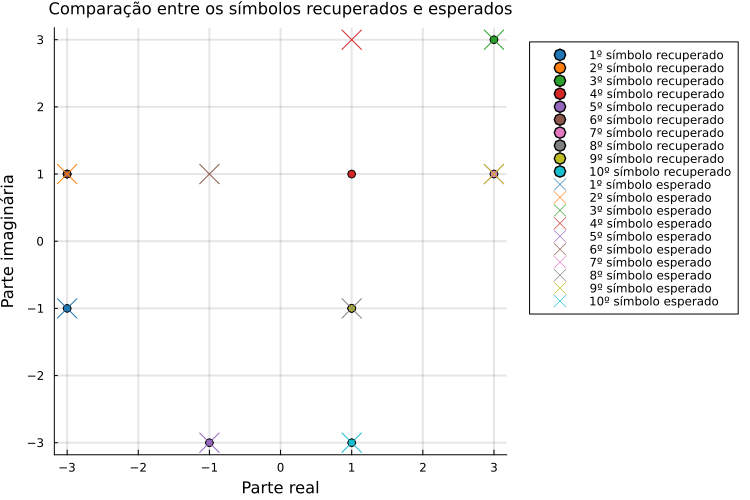

In [51]:
simbolos_complexos_esperados = converte_decimal_complexo_16_qam(simbolos_esperados)


plt = plot(legend=:outertopright, size=(750,500), gridlinewidth = 2)
for i=1:10
    scatter!(plt, [real(simbolos_complexos_16_qam[i])],
                  [imag(simbolos_complexos_16_qam[i])],
                  label=string(i)*"º símbolo recuperado", mc=palette(:tab10)[i], marker=:o)
end


for i=1:10
    scatter!(plt, [real(simbolos_complexos_esperados[i])],
                  [imag(simbolos_complexos_esperados[i])],
                  label=string(i)*"º símbolo esperado", mc=palette(:tab10)[i], marker=:X, ms=10)
end


xlabel!("Parte real")
ylabel!("Parte imaginária")
title!("Comparação entre os símbolos recuperados e esperados", titlefontsize=11)

plt

Observamos que, neste caso, ocorre erro na recuperação dos símbolos. No entanto, em algumas das execuções, observou-se recuperação perfeita. **Observação:** A eventual variação entre execuções do código se deve ao fato de que o ruído que adicionamos ao sinal recebido é *aleatório* (e não estamos configurando a *seed* das funções que geram números aleatórios).

**3º caso) Adicionando ruído branco gaussiano de média nula e desvio-padrão 50**

In [52]:
# Sinais recebidos pelo arranjo, somados a um ruído branco gaussiano de média nula e desvio-padrão de 50
X_ruidoso_50 = X + 50 * randn(size(X))

# Saída do arranjo DAS
y_ruidoso_50 = DAS(X_ruidoso_50, fa, theta0, M, Omega0, d, c)

1×10000 adjoint(::Vector{ComplexF64}) with eltype ComplexF64:
 -3.00743e-5-1.63724e-5im  …  12.3775+2.1212im  10.4768+1.98895im

Plotando a parte real e imaginária de $y[n]$:

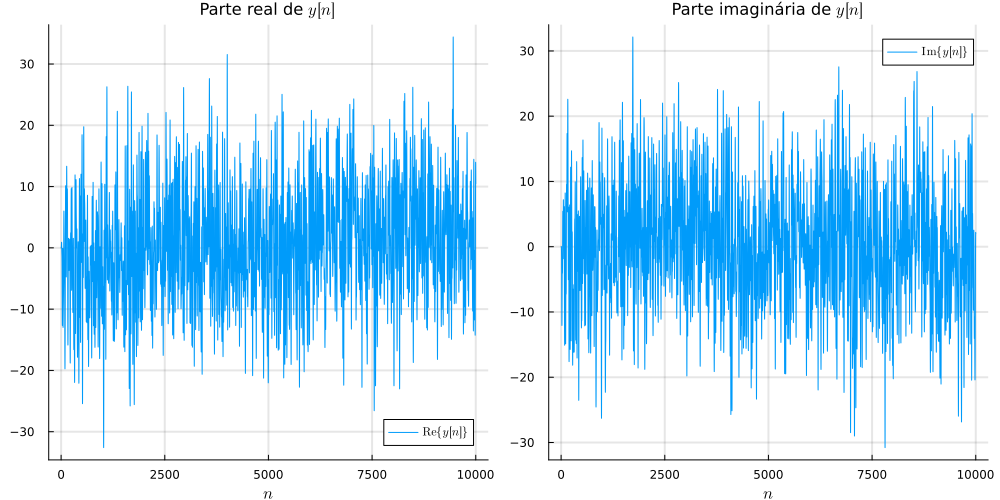

In [53]:
p1 = plot(vec(real(y_ruidoso_50)), label=L"$\textrm{Re}\{y[n]\}$")
title!(L"Parte real de $y[n]$", titlefontsize=11)
xlabel!(L"$n$")
p2 = plot(vec(imag(y_ruidoso_50)), label=L"$\textrm{Im}\{y[n]\}$")
title!(L"Parte imaginária de $y[n]$", titlefontsize=11)
xlabel!(L"$n$")

plot(p1, p2, layout = (1,2), gridlinewidth = 2)
plot!(size=(1000,500))

In [54]:
simbolos_complexos_recebidos = calcula_media_por_trechos(y_ruidoso_50, 1000, true);

1º símbolo:  -3.0321594235451084 - 1.2628793358388308im
2º símbolo:  -1.875432296926732 + 1.6396660274156976im
3º símbolo:  1.2516998972890396 + 2.9902537292795843im
4º símbolo:  0.19328203178047046 + 1.9775877372786081im
5º símbolo:  -0.7216397443865563 - 1.9893382061478309im
6º símbolo:  -0.8898158612639163 + 0.5068644532799578im
7º símbolo:  3.2111515001757684 + 1.2894946202022484im
8º símbolo:  1.7142927347543082 - 2.2805828382269486im
9º símbolo:  3.824314740351266 + 1.6761322978349922im
10º símbolo:  1.643753497734164 - 2.6484331288470555im


A seguir, apresentamos os símbolos reconstruídos (no código decimal) e avaliamos quantos estão corretos:

In [55]:
simbolos_complexos_16_qam = calcula_simbolos_complexos_16_qam(simbolos_complexos_recebidos)
simbolos_decimais_16_qam = converte_complexo_decimal_16_qam(simbolos_complexos_16_qam)

avalia_reconstrucao(simbolos_decimais_16_qam, simbolos_esperados);

Símbolos reconstruídos: [3, 5, 12, 13, 7, 5, 9, 14, 9, 14]
Símbolos esperados:     [3, 1, 8, 12, 6, 5, 9, 15, 9, 14]

Nº de símbolos corretamente reconstruídos / Nº total de símbolos = 5/10

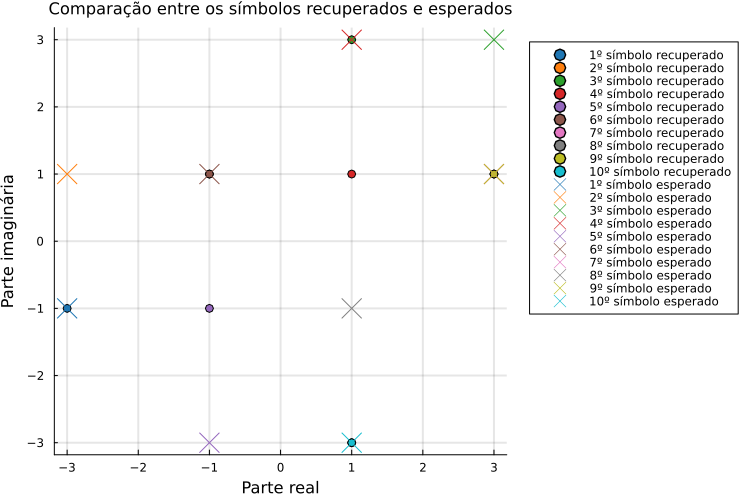

In [56]:
simbolos_complexos_esperados = converte_decimal_complexo_16_qam(simbolos_esperados)


plt = plot(legend=:outertopright, size=(750,500), gridlinewidth = 2)
for i=1:10
    scatter!(plt, [real(simbolos_complexos_16_qam[i])],
                  [imag(simbolos_complexos_16_qam[i])],
                  label=string(i)*"º símbolo recuperado", mc=palette(:tab10)[i], marker=:o)
end


for i=1:10
    scatter!(plt, [real(simbolos_complexos_esperados[i])],
                  [imag(simbolos_complexos_esperados[i])],
                  label=string(i)*"º símbolo esperado", mc=palette(:tab10)[i], marker=:X, ms=10)
end


xlabel!("Parte real")
ylabel!("Parte imaginária")
title!("Comparação entre os símbolos recuperados e esperados", titlefontsize=11)

plt

Notamos que, neste caso, verifica-se um número ainda maior de erros na recuperação dos símbolos. Tal efeito é esperado, uma vez que o ruído adicionado aos sinais nas antenas possui desvio-padrão suficientemente elevado, de forma a comprometer significativamente o sinal original. Em outras palavras, à medida que a relação sinal-ruído se deteriora (isto é, diminui), a recuperação dos símbolos é dificultada.

*Comentários sobre os três casos (desvio-padrão igual a 10, 30 e 50):*

Analisando os gráficos das partes real e imaginária de $y[n]$ para cada um dos casos considerados, observamos que tais sinais atingem valores mais distantes dos níveis esperados pela codificação 16-QAM (isto é, -1, +1, -3 e +3), devido ao ruído adicionado. À medida que o ruído se intensifica (com o aumento do desvio-padrão), a identificação dos degraus que codificam os símbolos em 16-QAM se torna menos clara, e, portanto, a recuperação dos símbolos codificados se torna cada vez mais difícil. 

De fato, observando os gráficos (no plano complexo) contendo os símbolos recuperados e transmitidos, e considerando o desvio-padrão de 30 e 50, notamos que alguns dos símbolos são incorretamente recuperados. Por outro lado, a recuperação tende a ser perfeita quando o desvio-padrão selecionado para o ruído é igual a 10 (ao menos nas execuções realizadas), o que demonstra uma certa robustez do sistema DAS projetado.